## Load Dataset

data: https://www.kaggle.com/datasets/uciml/human-activity-recognition-with-smartphones/data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
import plotly.figure_factory as ff
import plotly.io as pio
from plotly.subplots import make_subplots
pio.renderers.default = 'notebook'
train = pd.read_csv('train.csv')
train.head()

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",subject,Activity
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627,1,STANDING
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317,1,STANDING
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118,1,STANDING
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663,1,STANDING
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892,1,STANDING


In [2]:
train.shape

(7352, 563)

In [3]:
test = pd.read_csv("test.csv")

In [4]:
test.shape

(2947, 563)

## Data Wrangling

### Handling missing values

In [5]:
print("Missing values in train:"+str(train.isnull().values.sum()))
print("Missing values in test:"+str(test.isnull().values.sum()))

Missing values in train:0
Missing values in test:0


### Check if there are duplicates

In [6]:
print("Duplicated values in train:"+str(sum(train.duplicated())))
print("Duplicated values in test:"+str(sum(test.duplicated())))

Duplicated values in train:0
Duplicated values in test:0


### Check if the data is imbalance

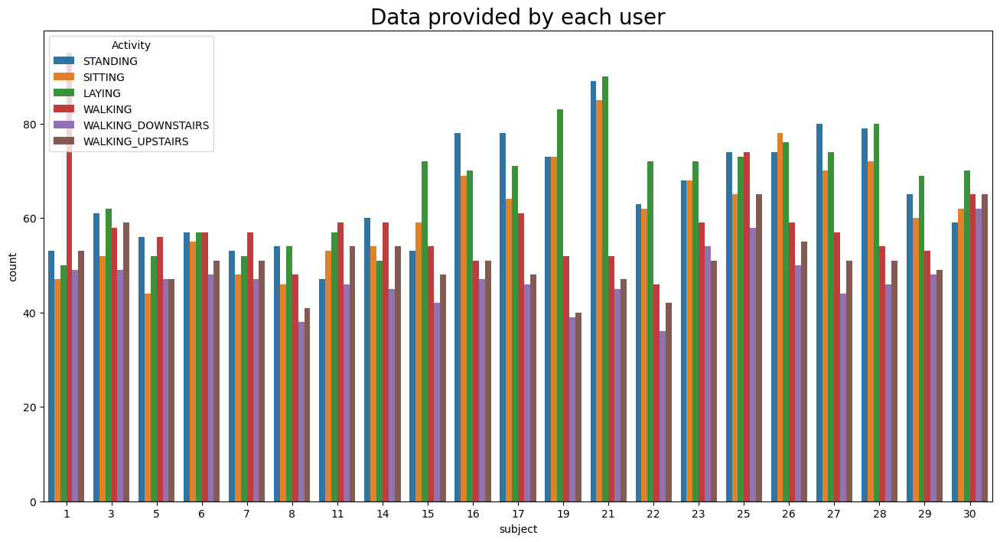

In [7]:
plt.figure(figsize=(16,8))
plt.title('Data provided by each user', fontsize=20)
sns.countplot(x='subject',hue='Activity', data = train)
plt.show()

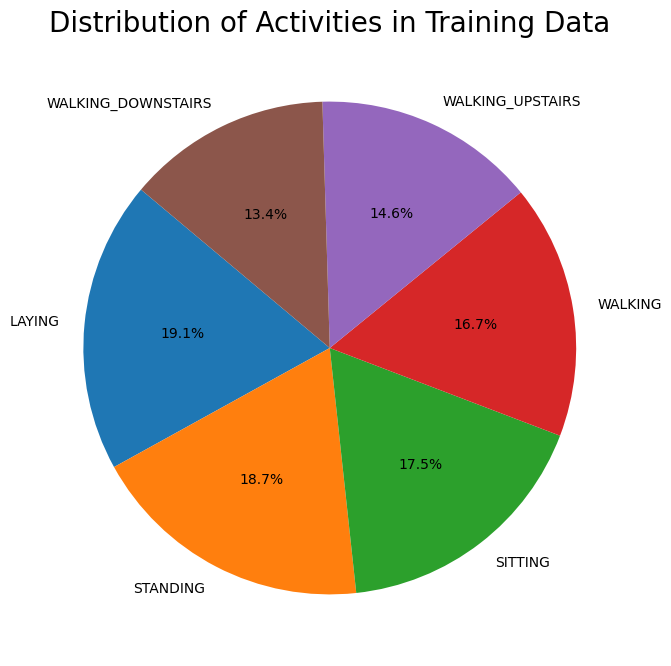

In [8]:
# Count the occurrences of each activity
activity_counts = train['Activity'].value_counts()

# Create a pie chart
plt.figure(figsize=(16,8))
plt.title('Distribution of Activities in Training Data', fontsize=20)
plt.pie(activity_counts, labels=activity_counts.index, autopct='%1.1f%%', startangle=140)
plt.show()

<b>Observation:</b><br>
Our data is well balanced (almost)

### Change the features names

In [9]:
columns = train.columns

# Removing '(', ')', '-', ',' from column names
columns = columns.str.replace('(','')
columns = columns.str.replace(')','')
columns = columns.str.replace('-', '')
columns = columns.str.replace(',','')

train.columns = columns
test.columns = columns

train.columns, test.columns

(Index(['tBodyAccmeanX', 'tBodyAccmeanY', 'tBodyAccmeanZ', 'tBodyAccstdX',
        'tBodyAccstdY', 'tBodyAccstdZ', 'tBodyAccmadX', 'tBodyAccmadY',
        'tBodyAccmadZ', 'tBodyAccmaxX',
        ...
        'fBodyBodyGyroJerkMagkurtosis', 'angletBodyAccMeangravity',
        'angletBodyAccJerkMeangravityMean', 'angletBodyGyroMeangravityMean',
        'angletBodyGyroJerkMeangravityMean', 'angleXgravityMean',
        'angleYgravityMean', 'angleZgravityMean', 'subject', 'Activity'],
       dtype='object', length=563),
 Index(['tBodyAccmeanX', 'tBodyAccmeanY', 'tBodyAccmeanZ', 'tBodyAccstdX',
        'tBodyAccstdY', 'tBodyAccstdZ', 'tBodyAccmadX', 'tBodyAccmadY',
        'tBodyAccmadZ', 'tBodyAccmaxX',
        ...
        'fBodyBodyGyroJerkMagkurtosis', 'angletBodyAccMeangravity',
        'angletBodyAccJerkMeangravityMean', 'angletBodyGyroMeangravityMean',
        'angletBodyGyroJerkMeangravityMean', 'angleXgravityMean',
        'angleYgravityMean', 'angleZgravityMean', 'subject', 'Activity

## EDA

### Stationary V.S. Moving activities

In static activities such as sitting, standing, and laying, motion data tends to be less informative.<br>
Conversely, in dynamic activities like walking, walking upstairs, and walking downstairs, motion information plays a more significant role.

In [10]:
laying = train[train['Activity'] == 'LAYING'].iloc[:986]
sitting = train[train['Activity'] == 'SITTING'].iloc[:986]
standing = train[train['Activity'] == 'STANDING'].iloc[:986]
walking = train[train['Activity'] == 'WALKING'].iloc[:986]
walking_downstairs = train[train['Activity'] == 'WALKING_DOWNSTAIRS'].iloc[:986]
walking_upstairs = train[train['Activity'] == 'WALKING_UPSTAIRS'].iloc[:986]

In [11]:
# Assuming 'laying', 'sitting', etc., are DataFrames filtered from 'train'
hist_data = [laying['tBodyAccMagmean'], sitting['tBodyAccMagmean'], 
             standing['tBodyAccMagmean'], walking['tBodyAccMagmean'],
             walking_downstairs['tBodyAccMagmean'], walking_upstairs['tBodyAccMagmean']]
group_labels = ['Laying', 'Sitting', 'Standing', 'Walking', 'Walking Downstairs', 'Waking Upstairs']

# Distribution plot
fig1 = ff.create_distplot(hist_data, group_labels, show_hist=False)
fig1.add_annotation(x=-0.9, y=13, text="Stationary Activity", showarrow=False, arrowhead=1, align='right')
fig1.add_annotation(x=-0.1, y=4, text="Moving Activity", showarrow=True, arrowhead=1)
fig1.show()


We can clearly see the difference between stationary activities and Moving Activities as per above pdf distribution.

In [12]:
stationary_data = [laying['tBodyAccMagmean'], sitting['tBodyAccMagmean'], standing['tBodyAccMagmean']]
moving_data = [walking['tBodyAccMagmean'], walking_downstairs['tBodyAccMagmean'], walking_upstairs['tBodyAccMagmean']]

stationary_labels = ['Laying', 'Sitting', 'Standing']
moving_labels = ['Walking', 'Walking Downstairs', 'Walking Upstairs']

# Create subplots: 1 row, 2 columns
fig = make_subplots(rows=1, cols=2, subplot_titles=('Distribution of Stationary Activities', 'Distribution of Moving Activities'))

# Distribution plot for Stationary Activities
fig_stationary = ff.create_distplot(stationary_data, stationary_labels, show_hist=False)
for trace in fig_stationary['data']:
    fig.add_trace(trace, row=1, col=1)

# Distribution plot for Moving Activities
fig_moving = ff.create_distplot(moving_data, moving_labels, show_hist=False)
for trace in fig_moving['data']:
    fig.add_trace(trace, row=1, col=2)

# Update layout for a closer view
fig.update_layout(title_text='Distribution of Activities (Closer View)', showlegend=False)
fig.update_xaxes(title_text='tBodyAccMagmean', row=1, col=1)
fig.update_xaxes(title_text='tBodyAccMagmean', row=1, col=2)

# Show the plot
fig.show()

### Magnitude of Accelaration

In [13]:

# Box plot for 'tBodyAccMag-mean()'
fig2 = px.box(train, x='Activity', y='tBodyAccMagmean', color='Activity')
fig2.add_shape(type="line",
               x0=2.5, y0=-0.1, x1=6, y1=-0.1,
               line=dict(color="Blue", width=1, dash="dashdot",))

fig2.add_shape(type="line",
               x0=-1, y0=-0.7, x1=2.5, y1=-0.7,
               line=dict(color="Green", width=1, dash="dashdot",))
fig2.show()

# Box plot for 'fBodyAccMag-mean()'
fig3 = px.box(train, x='Activity', y='fBodyAccMagmean', color='Activity')
fig3.show()



<b>Observations:</b><br>
* If tAccMean is < -0.8 then the Activities are either Standing or Sitting or Laying.
* If tAccMean is > -0.6 then the Activities are either Walking or WalkingDownstairs or WalkingUpstairs.
* If tAccMean > 0.0 then the Activity is WalkingDownstairs.
* We can classify 75% the Acitivity labels with some errors.

### Position of GravityAccelerationComponents

In [14]:
# Box plot for 'tBodyAccMag-mean()'
fig4 = px.box(train, x='Activity', y='angleXgravityMean', color='Activity')
fig4.add_shape(type="line",
               x0=-1, y0=0.1, x1=6, y1=0.1,
               line=dict(color="Grey", width=1, dash="dashdot",))
fig4.show()

# Box plot for 'fBodyAccMag-mean()'
fig5 = px.box(train, x='Activity', y='angleYgravityMean', color='Activity')
fig5.show()


# Box plot for 'fBodyAccMag-mean()'
fig6 = px.box(train, x='Activity', y='angleZgravityMean', color='Activity')
fig6.show()



<b>Observations:</b><br>
* If angleX,gravityMean > 0 then Activity is Laying.
* We can classify all datapoints belonging to Laying activity with just a single if else statement.

We can also use 3D plot to understand variation of Gravity Accelaration Components, as every Smartphone sensors works in 3-Dimensional Plane.

In [15]:
def plot3d (activity):
    x = activity['angleXgravityMean']
    y = activity['angleYgravityMean']
    z = [activity['angleZgravityMean']] * 200
    fig7 = go.Figure(data=[go.Surface(z=z, x=x, y=y)])
    fig7.update_layout(title=activity['Activity'].values[0], autosize=True,
                       margin=dict(l=65, r=50, b=65, t=90))
    fig7.show()

In [16]:
print('3D plot for Stationary Activities:')
plot3d(laying)
plot3d(sitting)
plot3d(standing)

3D plot for Stationary Activities:


In [17]:
print('3D plot for Moving Activities:')
plot3d(walking)
plot3d(walking_upstairs)
plot3d(walking_downstairs)

3D plot for Moving Activities:


### Scaling

In [18]:
from sklearn.preprocessing import StandardScaler

# List all columns excluding 'Activity'
features = [column for column in train.columns if column != 'Activity']

scaler = StandardScaler()


# Fit on training data
train_features = train[features]
scaler.fit(train_features)

# Transform training data
train_scaled = scaler.transform(train_features)

# Transform testing data (do NOT fit the scaler again on test data)
test_features = test[features]
test_scaled = scaler.transform(test_features)


train_scaled = pd.DataFrame(train_scaled, columns=features)
test_scaled = pd.DataFrame(test_scaled, columns=features)


In [19]:
train_scaled

,tBodyAccmeanX,tBodyAccmeanY,tBodyAccmeanZ,tBodyAccstdX,tBodyAccstdY,tBodyAccstdZ,tBodyAccmadX,tBodyAccmadY,tBodyAccmadZ,tBodyAccmaxX,...,fBodyBodyGyroJerkMagskewness,fBodyBodyGyroJerkMagkurtosis,angletBodyAccMeangravity,angletBodyAccJerkMeangravityMean,angletBodyGyroMeangravityMean,angletBodyGyroJerkMeangravityMean,angleXgravityMean,angleYgravityMean,angleZgravityMean,subject
0,0.200642,-0.063683,-0.419628,-0.868814,-0.939441,-0.737529,-0.859817,-0.939019,-0.766437,-0.856036,...,0.025960,-0.276399,-0.360603,0.062940,-0.778427,-0.026080,-0.687219,0.407946,-0.007568,-1.828851
1,0.055948,0.031486,-0.253908,-0.875426,-0.923902,-0.849304,-0.868531,-0.921998,-0.848928,-0.871359,...,-0.897357,-0.767990,0.133011,-0.021461,-1.218805,1.484470,-0.694138,0.409117,0.007875,-1.828851
2,0.073515,-0.043416,-0.076295,-0.869039,-0.907760,-0.893785,-0.863137,-0.898854,-0.896701,-0.863323,...,-0.260878,-0.438316,-0.377840,0.391976,0.151207,1.704201,-0.702239,0.410288,0.026502,-1.828851
3,0.066696,-0.208422,-0.249712,-0.870626,-0.940022,-0.921805,-0.864503,-0.938124,-0.925279,-0.863323,...,0.591045,0.463155,-0.135025,-0.033637,1.037851,-1.003019,-0.701684,0.414650,0.031714,-1.828851
4,0.030469,0.027587,-0.109848,-0.875188,-0.934878,-0.921343,-0.867384,-0.931789,-0.928028,-0.870260,...,-0.138515,-0.240313,0.340406,0.268486,1.125918,-1.276282,-0.700152,0.425463,0.045225,-1.828851
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7347,0.358361,-0.967904,-1.273005,0.913859,1.095963,1.628612,0.821169,1.174137,1.609686,1.247727,...,-0.876738,-0.829197,-0.591277,1.846034,0.325923,-0.878008,-0.590763,0.605162,0.380984,1.402515
7348,-0.009044,0.243731,-0.676787,0.824887,1.026150,1.586100,0.726245,1.023755,1.658407,1.076279,...,-0.260847,-0.180290,0.166951,1.948561,-1.459501,0.849894,-0.551598,0.652468,0.381820,1.402515
7349,-0.015668,0.016781,1.132221,0.862975,0.810002,2.100249,0.768781,0.880813,2.266963,0.941403,...,1.034784,1.044548,0.131018,-0.599877,1.406760,1.479571,-0.565848,0.640597,0.348709,1.402515
7350,0.215866,-0.028123,-0.867710,0.860922,0.794902,2.086778,0.754697,0.944019,2.235301,1.047375,...,1.155541,0.913569,-0.326769,1.558312,1.525574,-1.220854,-0.577668,0.631478,0.293276,1.402515


In [20]:
train = pd.concat([train_scaled, train['Activity'].reset_index(drop=True)], axis=1)

test = pd.concat([test_scaled, test['Activity'].reset_index(drop=True)], axis=1)


In [21]:
train 

,tBodyAccmeanX,tBodyAccmeanY,tBodyAccmeanZ,tBodyAccstdX,tBodyAccstdY,tBodyAccstdZ,tBodyAccmadX,tBodyAccmadY,tBodyAccmadZ,tBodyAccmaxX,...,fBodyBodyGyroJerkMagkurtosis,angletBodyAccMeangravity,angletBodyAccJerkMeangravityMean,angletBodyGyroMeangravityMean,angletBodyGyroJerkMeangravityMean,angleXgravityMean,angleYgravityMean,angleZgravityMean,subject,Activity
0,0.200642,-0.063683,-0.419628,-0.868814,-0.939441,-0.737529,-0.859817,-0.939019,-0.766437,-0.856036,...,-0.276399,-0.360603,0.062940,-0.778427,-0.026080,-0.687219,0.407946,-0.007568,-1.828851,STANDING
1,0.055948,0.031486,-0.253908,-0.875426,-0.923902,-0.849304,-0.868531,-0.921998,-0.848928,-0.871359,...,-0.767990,0.133011,-0.021461,-1.218805,1.484470,-0.694138,0.409117,0.007875,-1.828851,STANDING
2,0.073515,-0.043416,-0.076295,-0.869039,-0.907760,-0.893785,-0.863137,-0.898854,-0.896701,-0.863323,...,-0.438316,-0.377840,0.391976,0.151207,1.704201,-0.702239,0.410288,0.026502,-1.828851,STANDING
3,0.066696,-0.208422,-0.249712,-0.870626,-0.940022,-0.921805,-0.864503,-0.938124,-0.925279,-0.863323,...,0.463155,-0.135025,-0.033637,1.037851,-1.003019,-0.701684,0.414650,0.031714,-1.828851,STANDING
4,0.030469,0.027587,-0.109848,-0.875188,-0.934878,-0.921343,-0.867384,-0.931789,-0.928028,-0.870260,...,-0.240313,0.340406,0.268486,1.125918,-1.276282,-0.700152,0.425463,0.045225,-1.828851,STANDING
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7347,0.358361,-0.967904,-1.273005,0.913859,1.095963,1.628612,0.821169,1.174137,1.609686,1.247727,...,-0.829197,-0.591277,1.846034,0.325923,-0.878008,-0.590763,0.605162,0.380984,1.402515,WALKING_UPSTAIRS
7348,-0.009044,0.243731,-0.676787,0.824887,1.026150,1.586100,0.726245,1.023755,1.658407,1.076279,...,-0.180290,0.166951,1.948561,-1.459501,0.849894,-0.551598,0.652468,0.381820,1.402515,WALKING_UPSTAIRS
7349,-0.015668,0.016781,1.132221,0.862975,0.810002,2.100249,0.768781,0.880813,2.266963,0.941403,...,1.044548,0.131018,-0.599877,1.406760,1.479571,-0.565848,0.640597,0.348709,1.402515,WALKING_UPSTAIRS
7350,0.215866,-0.028123,-0.867710,0.860922,0.794902,2.086778,0.754697,0.944019,2.235301,1.047375,...,0.913569,-0.326769,1.558312,1.525574,-1.220854,-0.577668,0.631478,0.293276,1.402515,WALKING_UPSTAIRS


## Model Selection

In model selection phase, we train the data into multiple classifier Algorithms. 

KNeighborsClassifier

SVC

Decision-Tree Classifier

Random-Forest Classifier

GaussianNB

Ridge Classifier

Logistic Regression



In [22]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.utils import shuffle
from sklearn.ensemble import RandomForestClassifier, StackingClassifier, GradientBoostingClassifier
from sklearn.linear_model import RidgeClassifier
from sklearn.svm import SVC
from sklearn.metrics import f1_score, confusion_matrix, roc_auc_score, roc_curve
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
import xgboost as xgb
import lightgbm as lgb

train = shuffle(train)
test = shuffle(test)
X_train = train.drop(['subject', 'Activity'], axis=1).values
y_train = train['Activity'].values
X_test = test.drop(['subject', 'Activity'], axis=1).values
y_test = test['Activity'].values
print('Training data size : ', X_train.shape)
print('Test data size : ', X_test.shape)

labels=['LAYING', 'SITTING','STANDING','WALKING','WALKING_DOWNSTAIRS','WALKING_UPSTAIRS']

Training data size :  (7352, 561)
Test data size :  (2947, 561)


Our data has too many features, we will use some techniques to do feature selection.<br>
But before feature selection, we will train some baseline models first. 

### Use Different Classifiers

We plan to use these classifiers on the training data:<br>

- KNeighborsClassifier
- SVC
- Decision-Tree Classifier
- Random-Forest Classifier
- GaussianNB
- Ridge Classifier
- Logistic Regression

In [23]:
# declare the classifiers we gonna use
classifiers = [
    KNeighborsClassifier(5),
    SVC(kernel="rbf"),
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    GaussianNB(),
    RidgeClassifier(),
    LogisticRegression(C=0.1,penalty='l1',solver='liblinear')
]

Define the f_score function to get all f_score from different claasifiers

In [24]:
def f_score(x_train, x_test, y_train, y_test, classifiers, train_test):

    """
    f_score computes the f1-Score of the all models.

    :param x_train: training features.
    :param x_test: testing features.
    :param y_train: training labels.
    :param y_test: testing labels.
    :param classifier: list of classification algorithm

    Return 
    """
    if train_test == 1:
        x_test = x_train
        y_test = y_train
        
    for clf in classifiers:
        clf.fit(x_train,y_train)
        y_pred = clf.predict(x_test)
        f = f1_score(y_true=y_test,y_pred=y_pred,average="macro") # multi-label
        score = round(f*100, 4)

        print(f"Score: {score:.2f}% \t Classifier: {clf.__class__.__name__}")

<b>F1-Score:</b><br><br>
Recall = TruePositives / (TruePositives + FalseNegatives)

Precision = TruePositives / (TruePositives + FalsePositives)

F1 = 2 (precision recall) / (precision + recall)

In [25]:
print('F1 score on training data:')
f_score(X_train, X_test, y_train, y_test, classifiers, 1)

F1 score on training data:
Score: 98.37% 	 Classifier: KNeighborsClassifier
Score: 98.77% 	 Classifier: SVC
Score: 100.00% 	 Classifier: DecisionTreeClassifier
Score: 100.00% 	 Classifier: RandomForestClassifier
Score: 75.20% 	 Classifier: GaussianNB
Score: 98.67% 	 Classifier: RidgeClassifier
Score: 98.70% 	 Classifier: LogisticRegression


In [26]:
print('F1 score on testing data:')
f_score(X_train, X_test, y_train, y_test, classifiers, 0)

F1 score on testing data:
Score: 88.05% 	 Classifier: KNeighborsClassifier
Score: 95.11% 	 Classifier: SVC
Score: 85.33% 	 Classifier: DecisionTreeClassifier
Score: 92.93% 	 Classifier: RandomForestClassifier
Score: 76.72% 	 Classifier: GaussianNB
Score: 96.24% 	 Classifier: RidgeClassifier
Score: 95.13% 	 Classifier: LogisticRegression


<b>Observations:</b><br>
On our all classifiers:
- The differnce between training and testing data of F1 scores indicate KNeighborsClassifier, DecisionTreeClassifier, RandomForestClassifier are overfitting.
- RidgeClassifier, LogisticRegression, SVC are both good at training and testing data

### Stacking Classifier

We used Stacking that combines multiple base models RandomForestClassifier, KNeighborsClassifier, SVC, DecisionTreeClassifier, RidgeClassifier(also known as level-0 models) with a meta-model LogisticRegression (level-1 model) to improve prediction performane.

In [27]:
estimators = [
        ('RFC' ,RandomForestClassifier(n_estimators=500, random_state = 42)),
        ('KNC', KNeighborsClassifier(5)),
        ('DTC', DecisionTreeClassifier()),
        ('SVC', SVC(kernel="rbf")),
        ('RC',  RidgeClassifier()),
]

clf = StackingClassifier(
    estimators=estimators,
    final_estimator=LogisticRegression(C=0.1,penalty='l1',solver='liblinear')
)

Define the ROC function

In [28]:
from sklearn.metrics import roc_curve, roc_auc_score
import plotly.graph_objects as go
import pandas as pd

def plot_roc_curves(model, actual_labels, predicted_probabilities, plot_title):
    """
    Generates and displays ROC curves for each class in a multi-class classification model.
    
    Parameters:
    - model: The classification model used.
    - actual_labels: Actual class labels.
    - predicted_probabilities: Class probabilities predicted by the model.
    - plot_title: Title for the ROC plot.
    """
    
    # Convert actual labels to one-hot encoded format
    onehot_labels = pd.get_dummies(actual_labels)

    # Initialize plot
    fig = go.Figure()
    # Add reference line
    fig.add_trace(go.Scatter(x=[0, 1], y=[0, 1], mode='lines', 
                             line=dict(dash='dash'), name='Reference'))

    # Plot ROC curve for each class
    for idx, label in enumerate(onehot_labels.columns):
        true_values = onehot_labels.iloc[:, idx]
        probabilities = predicted_probabilities[:, idx]

        fpr, tpr, _ = roc_curve(true_values, probabilities)
        auc = roc_auc_score(true_values, probabilities)

        trace_name = f"{label} (AUC={auc:.2f})"
        fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines', name=trace_name))

    # Set layout
    fig.update_layout(
        title=plot_title,
        xaxis_title='False Positive Rate',
        yaxis_title='True Positive Rate',
        yaxis=dict(scaleanchor="x", scaleratio=1),
        xaxis=dict(constrain='domain'),
        width=700, height=500
    )

    # Display plot
    fig.show()


In [29]:
clf.fit(X_train,y_train)

StackingClassifier(estimators=[('RFC',
                                RandomForestClassifier(n_estimators=500,
                                                       random_state=42)),
                               ('KNC', KNeighborsClassifier()),
                               ('DTC', DecisionTreeClassifier()),
                               ('SVC', SVC()), ('RC', RidgeClassifier())],
                   final_estimator=LogisticRegression(C=0.1, penalty='l1',
                                                      solver='liblinear'))

In [30]:
y_pred = clf.predict(X_train)
f1 = f1_score(y_true=y_train,y_pred=y_pred,average="macro")
print("Accuracy for Train data before feature selection")
print(f"Score: {round(f1, 4) * 100}%")
y_scores = clf.predict_proba(X_train)
plot_roc_curves(clf, y_train, y_scores, 'AUROC Curve for Training Data')

Accuracy for Train data before feature selection
Score: 99.94%


In [31]:
y_pred = clf.predict(X_test)
f2 = f1_score(y_true=y_test,y_pred=y_pred,average="macro")
print("Accuracy for Test data before feature selection")
print(f"Score: {round(f2, 4) * 100}%")
y_scores = clf.predict_proba(X_test)
plot_roc_curves(clf, y_test, y_scores, 'AUROC Curve for Testing Data')

Accuracy for Test data before feature selection
Score: 96.77%


<b>Observations:</b><br>
On our stacking classifiers:
- Accuracy for Train data before feature selection
Score: 99.94%
- Accuracy for Original Test data before feature selection
Score: 96.77%

## Fearure Selection

We use 561 features to train basline model, now we want to know which are the most important features.<br>


In [32]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier

def featureSelection():
    train = pd.read_csv("train.csv")

    columns = train.columns
    # Removing '(', ')', '-', ',' from column names
    columns = columns.str.replace('(','')
    columns = columns.str.replace(')','')
    columns = columns.str.replace('-', '')
    columns = columns.str.replace(',','')
    train.columns = columns

    x = train.drop(['subject', 'Activity'], axis=1)
    y = train['Activity']

    selectFeature = SelectFromModel(RandomForestClassifier())
    selectFeature.fit(x, y)

    features1 = x.columns[(selectFeature.get_support())]
    return features1

We use used Random-Forest Classifier as the model to select important Features .

In [33]:
features = featureSelection()

In [34]:
features

Index(['tBodyAccstdX', 'tBodyAccmadX', 'tBodyAccmaxX', 'tBodyAcccorrelationXY',
       'tBodyAcccorrelationYZ', 'tGravityAccmeanX', 'tGravityAccmeanY',
       'tGravityAccmeanZ', 'tGravityAccstdX', 'tGravityAccmadX',
       ...
       'fBodyAccMagstd', 'fBodyAccMagmad', 'fBodyAccMagsma',
       'fBodyAccMagenergy', 'fBodyAccMagentropy', 'fBodyBodyAccJerkMagmad',
       'fBodyBodyAccJerkMagmax', 'angleXgravityMean', 'angleYgravityMean',
       'angleZgravityMean'],
      dtype='object', length=132)

In [35]:
X_train_1, X_test_1 = train.filter(items=features), test.filter(items=features)
X_train_1 = StandardScaler().fit_transform(X_train_1)
X_test_1 = StandardScaler().fit_transform(X_test_1)


In [36]:
X_train_1

array([[ 1.12469034,  1.26942957, -0.64769911, ...,  0.87248372,
        -0.93668664, -1.69801269],
       [ 2.09990447,  2.26880249,  1.85122714, ..., -0.6630903 ,
         0.28691385, -0.14377119],
       [ 1.23001674,  1.20137065,  1.48283545, ..., -0.41862   ,
         0.82038213,  0.29721208],
       ...,
       [-0.85801549, -0.85093748, -0.84964705, ...,  2.28616439,
        -2.15717077, -1.28419443],
       [-0.8602576 , -0.85388147, -0.84638957, ..., -0.56220712,
         0.62489767,  0.44268586],
       [ 2.30723502,  2.41688226,  2.11006963, ..., -0.62903035,
         0.57105359,  0.27157089]])

### Train the model after feature selection

Define the confusion_matrix function

In [37]:
def plot_confusion_matrix(conf_matrix, class_labels, plot_title):
    """
    Generates a heatmap for the confusion matrix.

    Parameters:
    - conf_matrix: Confusion matrix.
    - class_labels: Class labels for the matrix.
    - plot_title: Title for the plot.
    """
    
    # Convert the confusion matrix to a text matrix for annotations
    text_matrix = [[str(cell) for cell in row] for row in conf_matrix]

    # Create the heatmap
    fig = ff.create_annotated_heatmap(conf_matrix, x=class_labels, y=class_labels, 
                                      annotation_text=text_matrix, colorscale='Viridis')

    # Update layout with title and axis labels
    fig.update_layout(
        title=plot_title,
        xaxis_title="Predicted Label",
        yaxis_title="True Label",
        margin=dict(t=50, l=200)
    )

    # Show the plot
    fig.show()


In [38]:
clf.fit(X_train_1,y_train)

StackingClassifier(estimators=[('RFC',
                                RandomForestClassifier(n_estimators=500,
                                                       random_state=42)),
                               ('KNC', KNeighborsClassifier()),
                               ('DTC', DecisionTreeClassifier()),
                               ('SVC', SVC()), ('RC', RidgeClassifier())],
                   final_estimator=LogisticRegression(C=0.1, penalty='l1',
                                                      solver='liblinear'))

In [39]:
y_pred = clf.predict(X_train_1)
f1 = f1_score(y_true=y_train,y_pred=y_pred,average="macro")
cm = confusion_matrix(y_true=y_train,y_pred=y_pred, labels=['LAYING', 'SITTING', 'STANDING', 'WALKING', 'WALKING_DOWNSTAIRS', 'WALKING_UPSTAIRS'])
print("Accuracy for Train data after feature selection")
print(f"Score: {round(f1, 4) * 100}%")
plot_confusion_matrix(cm, labels, "Confusion Matrix (Training)")    # Confusion matrix for training data
y_scores = clf.predict_proba(X_train_1)
plot_roc_curves(clf, y_train, y_scores, 'AUROC Curve for Training Data (After Feature Selection)')

Accuracy for Train data after feature selection
Score: 99.97%


In [40]:
y_pred = clf.predict(X_test_1)
f2 = f1_score(y_true=y_test,y_pred=y_pred,average="macro")
cm = confusion_matrix(y_true=y_test,y_pred=y_pred, labels=['LAYING', 'SITTING', 'STANDING', 'WALKING', 'WALKING_DOWNSTAIRS', 'WALKING_UPSTAIRS'])
print("Accuracy for Test data before feature selection")
print(f"Score: {round(f2, 4) * 100}%")
plot_confusion_matrix(cm, labels, "Confusion Matrix (Testing)")    # Confusion matrix for training data
y_scores = clf.predict_proba(X_test_1)
plot_roc_curves(clf, y_test, y_scores, 'AUROC Curve for Testing Data')

Accuracy for Test data before feature selection
Score: 91.67%


<b>Observations:</b><br>
Now we see the accuracy after feature selection<br>
- Accuracy for Train data after feature selection<br>Score: 99.97%
- Accuracy for Test data after feature selection<br>Score: 91.67%

After feature selection, the disparity between training and test performance is slightly overfitting.


## Dimensionality Reduction 

Also we will use UMAP, T-SNE to do  Dimensionality Reduction 

In [41]:
from sklearn.preprocessing import LabelEncoder
LE = LabelEncoder()

In [42]:
import plotly.graph_objs as go

def plot_2d(component1, component2, activities):
    """
    Plot 2 different Principal Components in 2D space with colors corresponding to activities.

    :param component1: Principal Component 1
    :param component2: Principal Component 2
    :param activities: Activities corresponding to each point, used for coloring and labels
    """
    
    # Unique activities for color scale
    unique_activities = activities.unique()
    # Map each activity to an integer
    activity_color_map = {activity: i for i, activity in enumerate(unique_activities)}
    # Convert activity labels to color values
    color_values = activities.map(activity_color_map)
    
    fig = go.Figure(data=go.Scatter(
        x=component1,
        y=component2,
        mode='markers',
        marker=dict(
            size=10,
            color=color_values,  # numeric color values mapped from activities
            colorscale='Rainbow',  # one of plotly colorscales
            showscale=True,
            line_width=1
        ),
        text=activities,  # activity labels, displayed on hover
        hoverinfo='text'
    ))
    fig.update_layout(
        margin=dict(l=100, r=100, b=100, t=100),
        width=2000,
        height=1200,
        template='plotly_dark'
    )

    # Add color scale for activities
    color_scale = [color / (len(unique_activities) - 1) for color in range(len(unique_activities))]
    fig.update_layout(coloraxis_colorbar=dict(
        title='Activity',
        tickvals=color_scale,
        ticktext=unique_activities
    ))

    fig.show()

### TSNE

In [43]:
from sklearn.manifold import TSNE

def perform_tsne(X_data, y_data, perplexities, n_iter=1000, img_name_prefix='t-sne'):
        
    for index,perplexity in enumerate(perplexities):
        # perform t-sne
        print('\nperforming tsne with perplexity {} and with {} iterations at max'.format(perplexity, n_iter))
        X_reduced = TSNE(verbose=2, perplexity=perplexity).fit_transform(X_data)
        print('Done..')
        
    return X_reduced

X_pre_tsne = train.drop(['subject', 'Activity'], axis=1)
y_pre_tsne = train['Activity']
X_reduced = perform_tsne(X_data = X_pre_tsne,y_data=y_pre_tsne, perplexities =[5,10,20])
X_reduced 


performing tsne with perplexity 5 and with 1000 iterations at max
[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 7352 samples in 0.008s...
[t-SNE] Computed neighbors for 7352 samples in 0.508s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7352
[t-SNE] Computed conditional probabilities for sample 2000 / 7352
[t-SNE] Computed conditional probabilities for sample 3000 / 7352
[t-SNE] Computed conditional probabilities for sample 4000 / 7352
[t-SNE] Computed conditional probabilities for sample 5000 / 7352
[t-SNE] Computed conditional probabilities for sample 6000 / 7352
[t-SNE] Computed conditional probabilities for sample 7000 / 7352
[t-SNE] Computed conditional probabilities for sample 7352 / 7352
[t-SNE] Mean sigma: 3.350976
[t-SNE] Computed conditional probabilities in 0.018s
[t-SNE] Iteration 50: error = 107.0512924, gradient norm = 0.0313800 (50 iterations in 1.275s)
[t-SNE] Iteration 100: error = 96.4872894, gradient norm = 0.0122483 (50 iterations in 

array([[-75.4093   ,  17.632238 ],
       [ 32.759075 ,  17.005438 ],
       [ 30.2891   ,   2.8298588],
       ...,
       [-33.667503 ,  55.687798 ],
       [  2.7403283, -21.612461 ],
       [ 45.34081  ,  23.58754  ]], dtype=float32)

In [44]:
plot_2d(X_reduced[:, 0],X_reduced[:, 1], train['Activity'])

### UMAP

In [45]:
import umap.umap_ as umap

X_pre_umap = train.drop(['subject', 'Activity'], axis=1)

reducer = umap.UMAP(random_state=42,n_components=3)
embedding = reducer.fit_transform(X_pre_umap )

/Users/judyfang/anaconda3/envs/py39/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [46]:
plot_2d(reducer.embedding_[:, 0],reducer.embedding_[:, 1], train['Activity'])

UMAP performs better than T-SNE for this dataset, so we  transform our dataset according to the input of UMAP model. <br>
And then train the Stacked Classifier with the transformed data.

### Train the model according to UMAP

In [47]:
trans = umap.UMAP(n_neighbors=5, n_components=5 ,random_state=42).fit(X_train)
clf.fit(trans.embedding_,y_train)
train_embedding = trans.transform(X_train)
y_pred = clf.predict(train_embedding)
f1 = f1_score(y_true=y_train,y_pred=y_pred,average="macro")
print(f"Score: {round(f1, 4) * 100}%")
y_scores = clf.predict_proba(train_embedding)
plot_roc_curves(clf, y_train, y_scores, 'AUROC Curve for Transformed UMAP Training Data')


/Users/judyfang/anaconda3/envs/py39/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning:

n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.



Score: 99.56%


In [48]:
test_embedding = trans.transform(X_test)
y_pred = clf.predict(test_embedding)
f1 = f1_score(y_true=y_test,y_pred=y_pred,average="macro")
print(f"Score: {round(f1, 4) * 100}%")
y_scores = clf.predict_proba(test_embedding)
plot_roc_curves(clf, y_test, y_scores,  'AUROC Curve for Transformed UMAP Test Data')

Score: 79.59%


<b>Observations:</b><br>
Now we see the accuracy after UMAP<br>
- Accuracy for Train data after feature selection<br>Score: 99.56%
- Accuracy for Test data after feature selection<br>Score: 79.59%

After UMAP, the disparity between training and test performance is even bigger than after feature selection, indeed a classic sign of overfitting.


## Summary

So we get best test accuracy of 96.77% for the Stacked Classifier model using all 561 features.